In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import re

import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

/home/eli/anaconda3/envs/HTFATorch/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
lepping_db = niidb.FMriActivationsDb('data/sound_depression.db', mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz')

In [6]:
dtfa = DTFA.DeepTFA([b for b in lepping_db.all() if 'response' not in b.task and 'tones' not in b.task],
                    mask='/home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz', num_factors=100, embedding_dim=2)

01/29/2020 15:32:51 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-music_run-3_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=False)
01/29/2020 15:32:53 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-music_run-2_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=False)
01/29/2020 15:32:56 Loading Nifti image /home/eli/Documents/sound_depression/fmriprep/sub-control01/func/sub-control01_task-nonmusic_run-4_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/sound_depression/ds000171-download/all_tasks/wholebrain.nii.gz (zscore=True, smooth=6, zscore_by_rest=False)
01/29/2020 15:32:58 Loading Nifti 

In [7]:
dtfa.num_parameters()

1286212

In [8]:
dtfa.load_state('data/lepping_2017_noresponse_trainval_k100_n1000_09262019_150448')

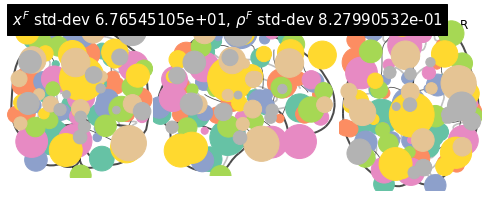

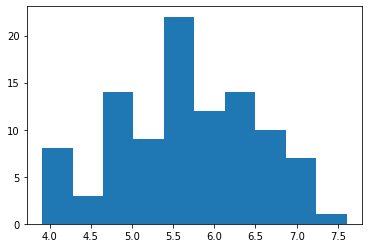

(<nilearn.plotting.displays.OrthoProjector at 0x7fa04e3943d0>,
 tensor([[-2.7361e+01, -1.0462e+02, -8.2954e+00],
         [ 5.1351e+01,  5.7242e+00, -2.8626e+00],
         [-5.2068e+00,  4.1883e+01, -1.9569e+00],
         [-2.5738e+01, -2.7911e+01,  4.3405e+01],
         [ 2.2742e+01, -5.2961e+01, -5.5827e+01],
         [ 2.3196e+01, -5.6130e+01,  5.7327e+01],
         [-3.0246e+01, -3.4052e+01, -3.3122e+01],
         [-1.0573e-01,  2.7510e+01,  7.1882e+01],
         [-3.4967e+01, -5.9524e+00,  9.7142e+00],
         [ 3.1225e+01, -4.9823e+01,  2.3763e+01],
         [ 1.9342e+01, -6.4824e+01, -1.0301e+01],
         [ 3.3568e+01,  3.9323e-01,  5.0955e+01],
         [-5.1340e+01, -4.8218e+01,  6.8242e+01],
         [ 7.9045e+00, -7.7621e+01,  5.4387e+01],
         [-2.6653e+01, -8.9073e+00,  3.2802e+01],
         [-5.6820e+01,  4.7044e+01, -8.3295e+00],
         [ 2.6930e+01,  6.2006e+01,  1.2105e+01],
         [ 3.7478e+01, -8.3242e+01,  2.1085e+01],
         [ 3.4403e+01,  4.0707e+01,  

In [9]:
dtfa.visualize_factor_embedding()

In [10]:
def subject_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        condition = 'Major Depressive'
    elif condition == 'control':
        condition = 'Control'
    return '%s Participant %d' % (condition, int(sub_num))

In [11]:
def task_labeler(task):
    if task == 'negative_music':
        task = 'Negative music'
    elif task == 'positive_music':
        task = 'Positive music'
    elif task == 'negative_nonmusic':
        task = 'Negative sounds'
    elif task == 'positive_nonmusic':
        task = 'Positive sounds'
    else:
        task = task.capitalize()
    return task

In [12]:
def lepping_2017_labeler(block):
    task = task_labeler(block.task)
    return task + ' stimulus'

In [13]:
validation_filter = lepping_db.inference_filter(training=False)
validation_blocks = [b for (b, block) in enumerate(dtfa._blocks) if validation_filter(block)]

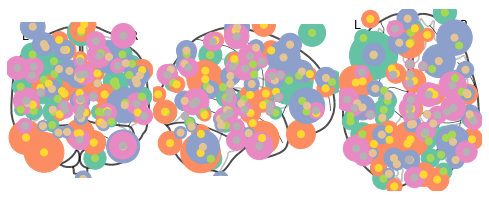

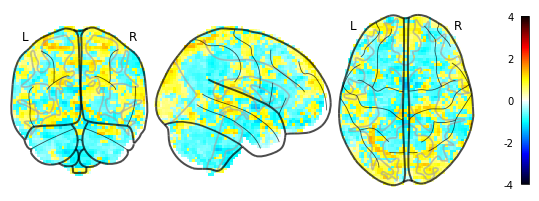

01/29/2020 15:39:38 Reconstruction Error (Frobenius Norm): 7.78056030e+01 out of 5.74926880e+02


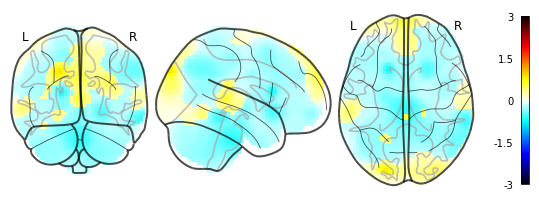

01/29/2020 15:39:40 Reconstruction Error (Frobenius Norm): 7.78056030e+01 out of 5.74926880e+02


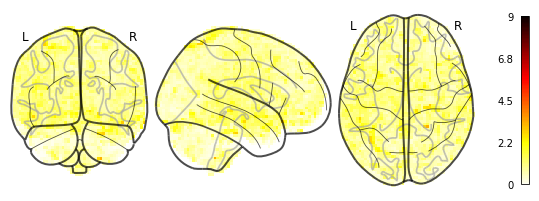

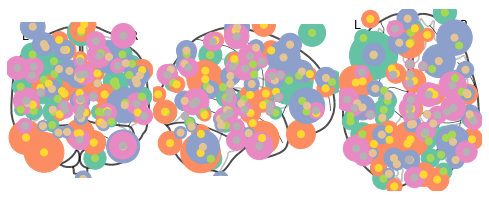

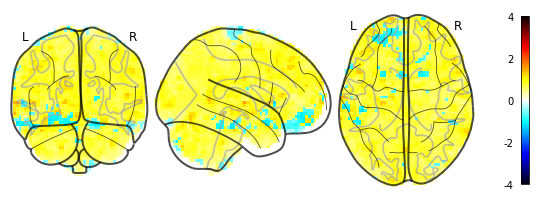

01/29/2020 15:39:44 Reconstruction Error (Frobenius Norm): 6.48183060e+01 out of 6.87497742e+02


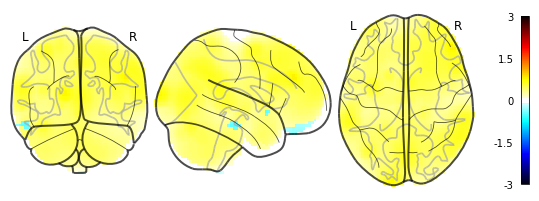

01/29/2020 15:39:46 Reconstruction Error (Frobenius Norm): 6.48183060e+01 out of 6.87497742e+02


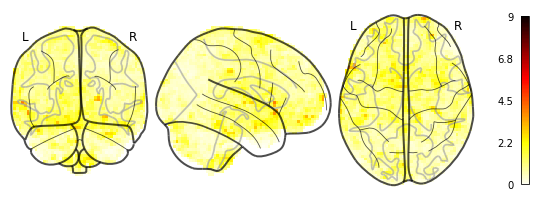

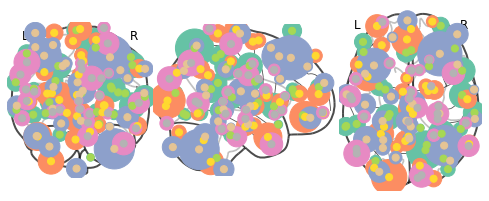

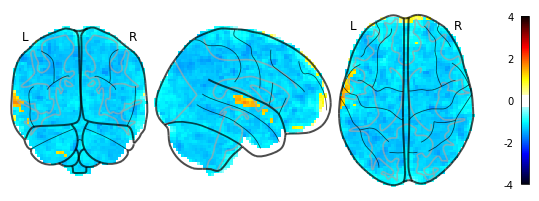

01/29/2020 15:39:50 Reconstruction Error (Frobenius Norm): 7.65998230e+01 out of 9.26607483e+02


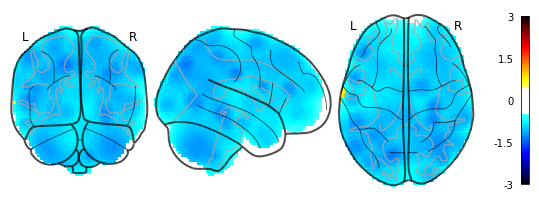

01/29/2020 15:39:52 Reconstruction Error (Frobenius Norm): 7.65998230e+01 out of 9.26607483e+02


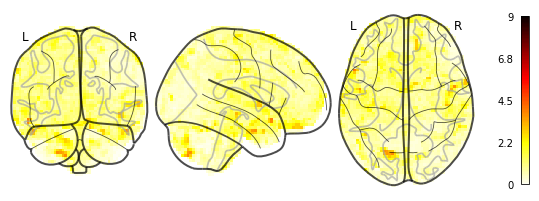

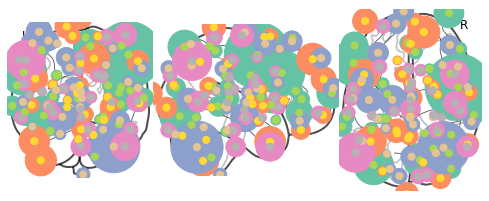

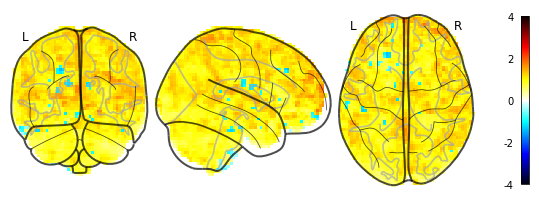

01/29/2020 15:39:56 Reconstruction Error (Frobenius Norm): 8.47407608e+01 out of 8.05482483e+02


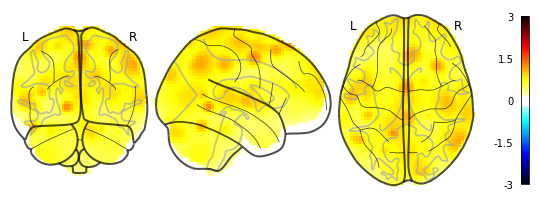

01/29/2020 15:39:57 Reconstruction Error (Frobenius Norm): 8.47407608e+01 out of 8.05482483e+02


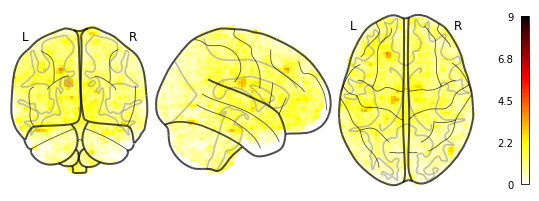

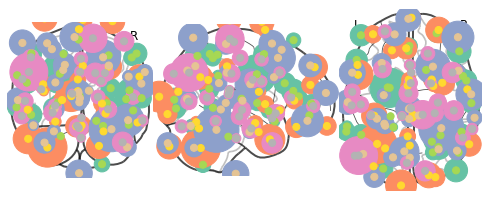

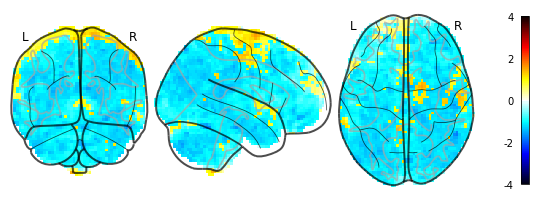

01/29/2020 15:40:02 Reconstruction Error (Frobenius Norm): 9.47312088e+01 out of 8.03104309e+02


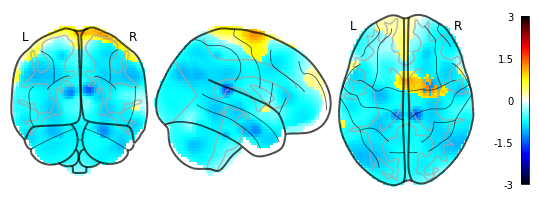

01/29/2020 15:40:03 Reconstruction Error (Frobenius Norm): 9.47312088e+01 out of 8.03104309e+02


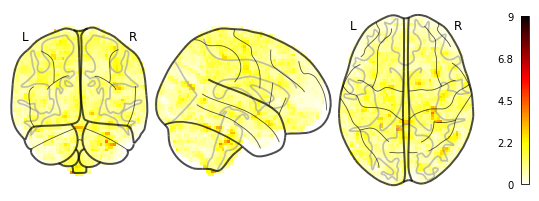

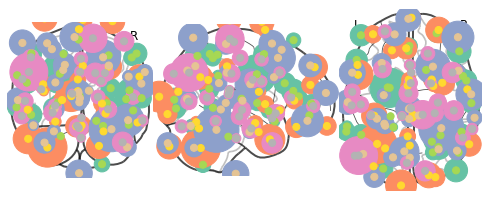

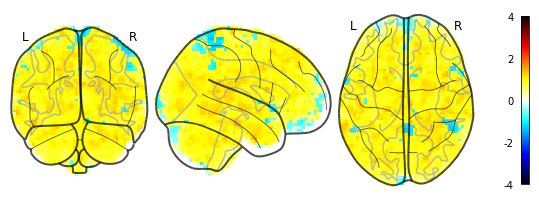

01/29/2020 15:40:07 Reconstruction Error (Frobenius Norm): 8.04801636e+01 out of 8.10351257e+02


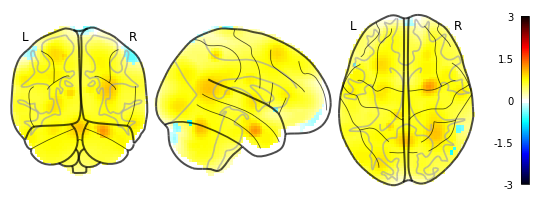

01/29/2020 15:40:09 Reconstruction Error (Frobenius Norm): 8.04801636e+01 out of 8.10351257e+02


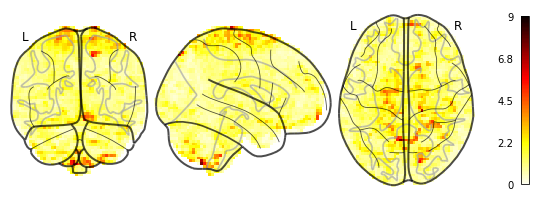

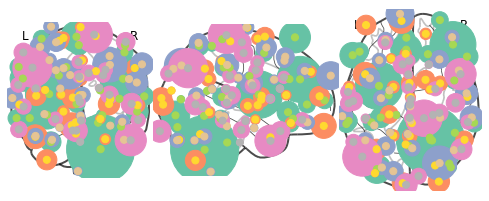

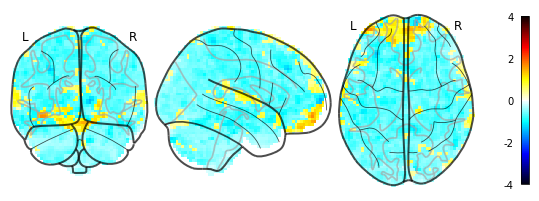

01/29/2020 15:40:13 Reconstruction Error (Frobenius Norm): 5.89741096e+01 out of 5.29257812e+02


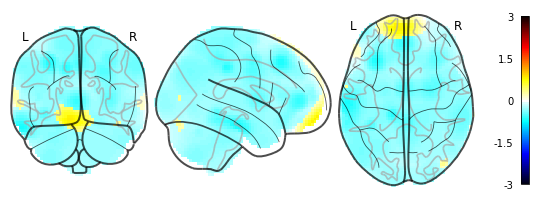

01/29/2020 15:40:15 Reconstruction Error (Frobenius Norm): 5.89741096e+01 out of 5.29257812e+02


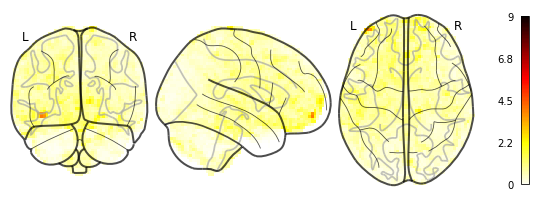

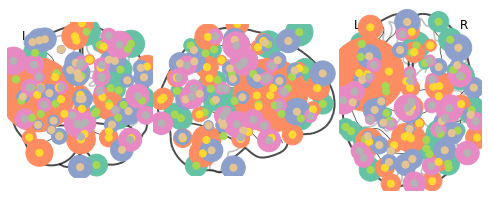

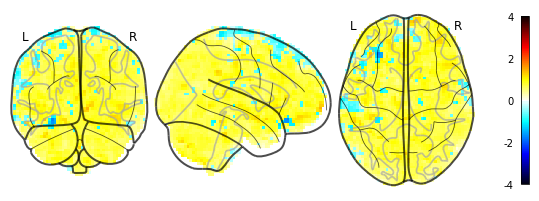

01/29/2020 15:40:19 Reconstruction Error (Frobenius Norm): 6.62519455e+01 out of 7.51278259e+02


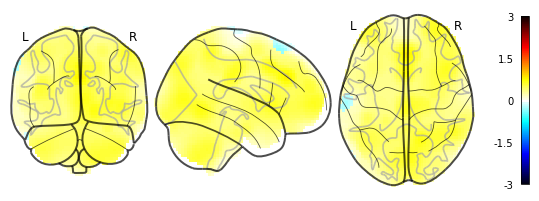

01/29/2020 15:40:21 Reconstruction Error (Frobenius Norm): 6.62519455e+01 out of 7.51278259e+02


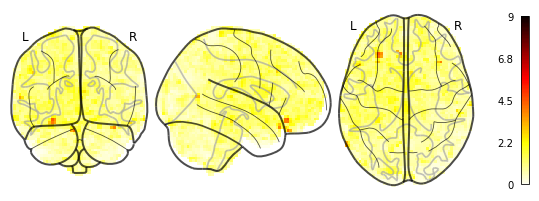

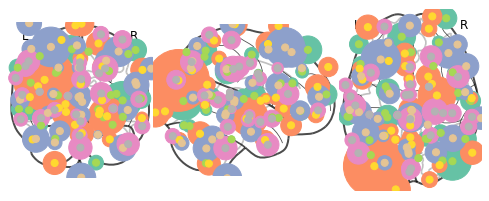

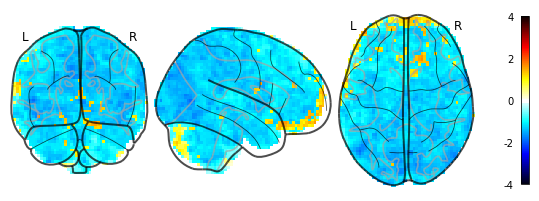

01/29/2020 15:40:25 Reconstruction Error (Frobenius Norm): 9.87113037e+01 out of 9.18257935e+02


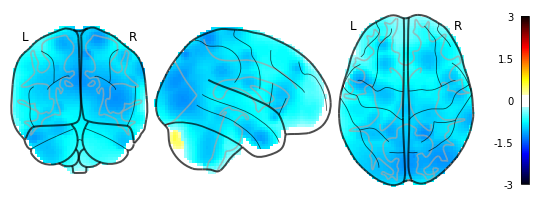

01/29/2020 15:40:27 Reconstruction Error (Frobenius Norm): 9.87113037e+01 out of 9.18257935e+02


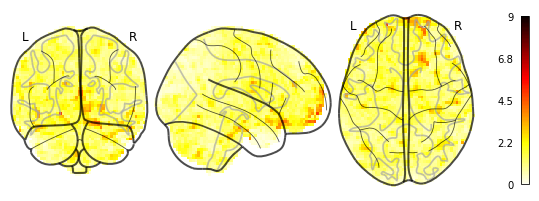

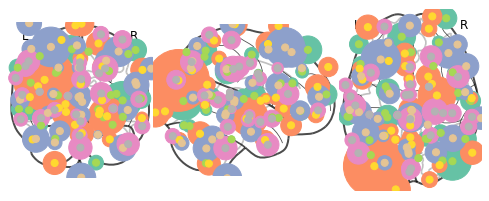

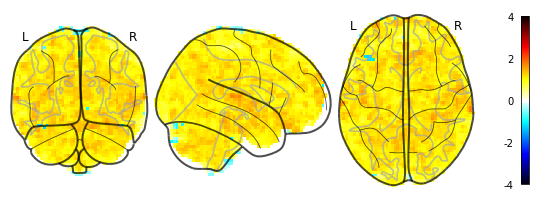

01/29/2020 15:40:31 Reconstruction Error (Frobenius Norm): 8.42791443e+01 out of 8.56945862e+02


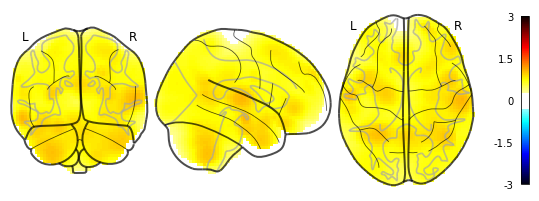

01/29/2020 15:40:32 Reconstruction Error (Frobenius Norm): 8.42791443e+01 out of 8.56945862e+02


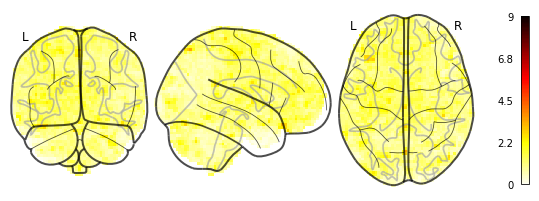

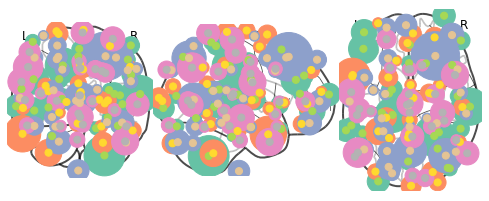

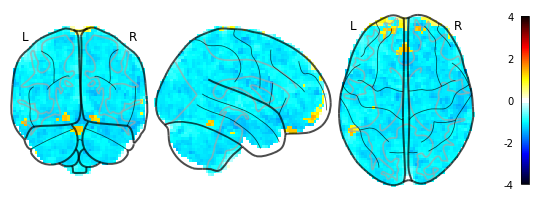

01/29/2020 15:40:37 Reconstruction Error (Frobenius Norm): 7.69158554e+01 out of 7.80868652e+02


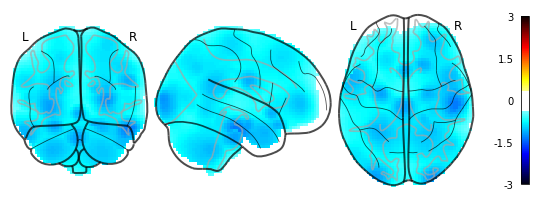

01/29/2020 15:40:38 Reconstruction Error (Frobenius Norm): 7.69158554e+01 out of 7.80868652e+02


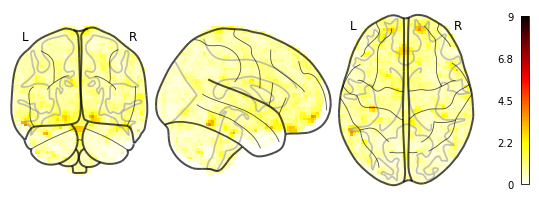

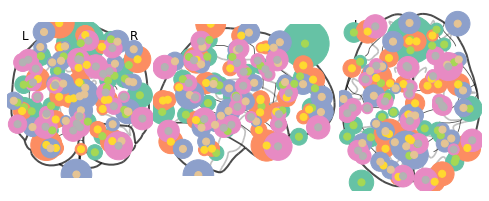

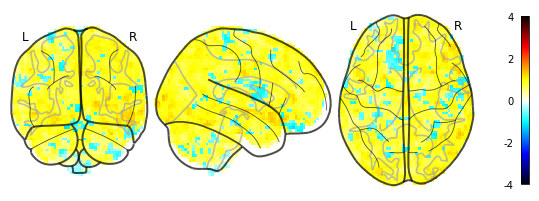

01/29/2020 15:40:42 Reconstruction Error (Frobenius Norm): 8.38914108e+01 out of 7.84110718e+02


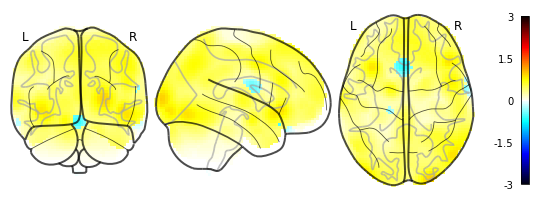

01/29/2020 15:40:44 Reconstruction Error (Frobenius Norm): 8.38914108e+01 out of 7.84110718e+02


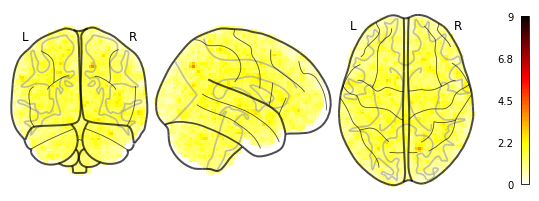

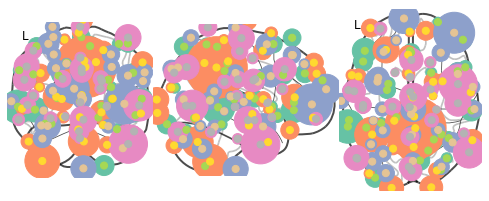

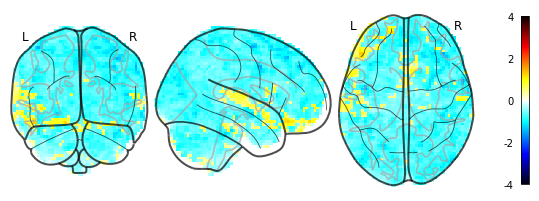

01/29/2020 15:40:48 Reconstruction Error (Frobenius Norm): 5.99481735e+01 out of 6.30472534e+02


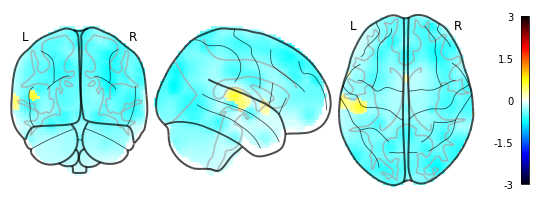

01/29/2020 15:40:50 Reconstruction Error (Frobenius Norm): 5.99481735e+01 out of 6.30472534e+02


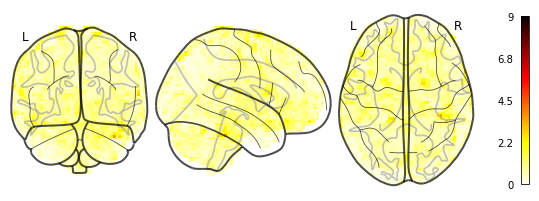

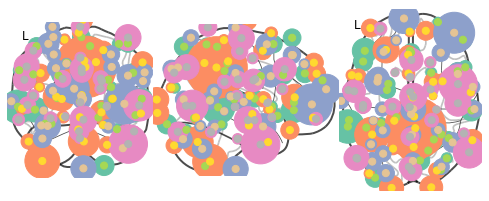

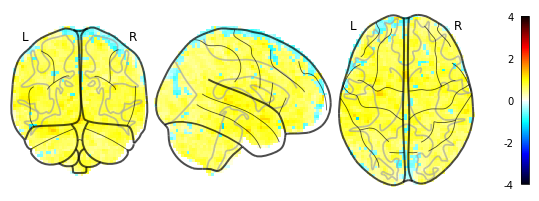

01/29/2020 15:40:54 Reconstruction Error (Frobenius Norm): 6.08789635e+01 out of 6.29986511e+02


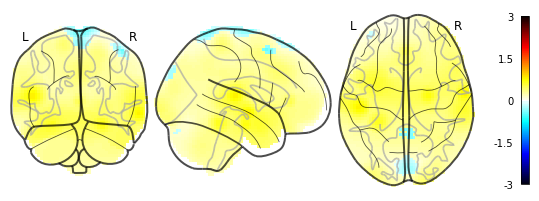

01/29/2020 15:40:56 Reconstruction Error (Frobenius Norm): 6.08789635e+01 out of 6.29986511e+02


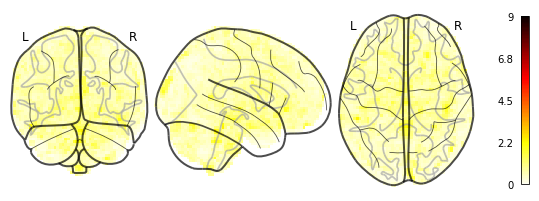

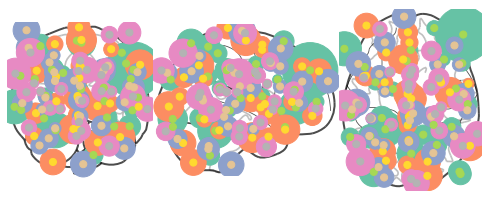

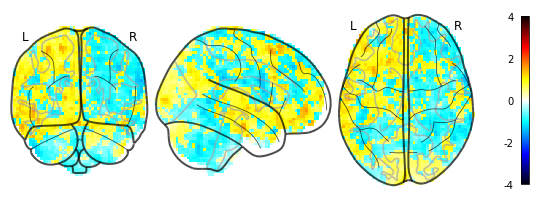

01/29/2020 15:41:00 Reconstruction Error (Frobenius Norm): 9.18876038e+01 out of 8.19678040e+02


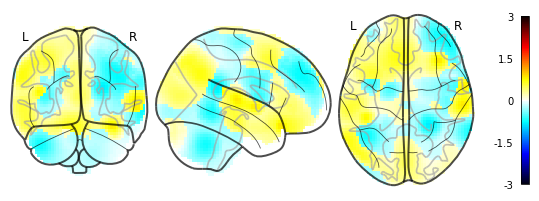

01/29/2020 15:41:02 Reconstruction Error (Frobenius Norm): 9.18876038e+01 out of 8.19678040e+02


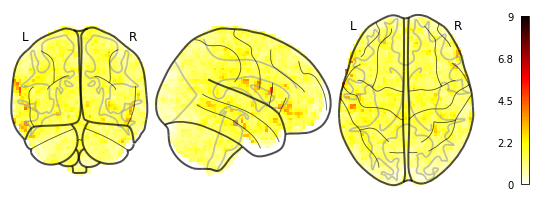

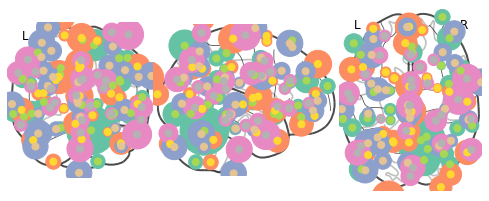

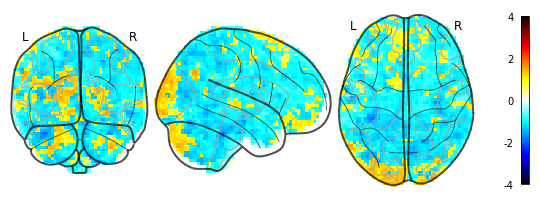

01/29/2020 15:41:06 Reconstruction Error (Frobenius Norm): 1.09358505e+02 out of 8.65308594e+02


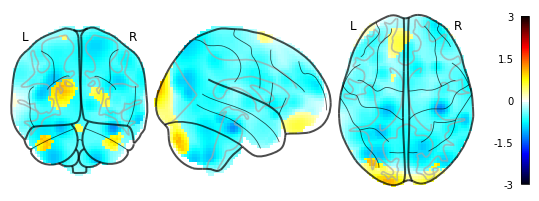

01/29/2020 15:41:07 Reconstruction Error (Frobenius Norm): 1.09358505e+02 out of 8.65308594e+02


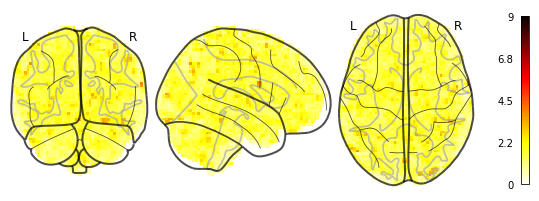

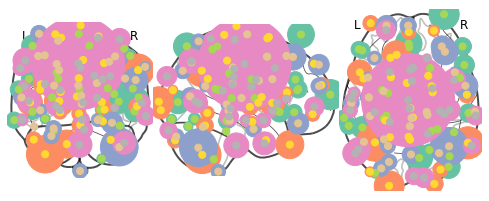

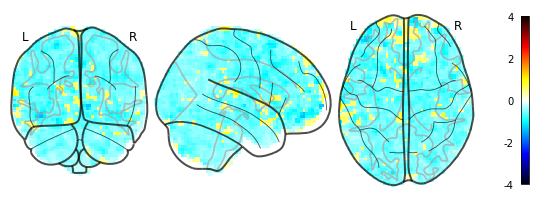

01/29/2020 15:41:11 Reconstruction Error (Frobenius Norm): 5.81056824e+01 out of 6.11537842e+02


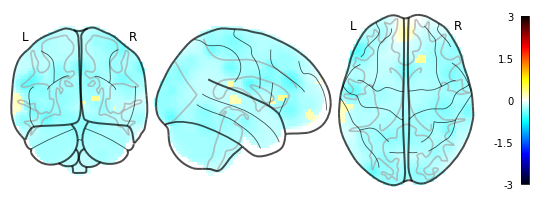

01/29/2020 15:41:13 Reconstruction Error (Frobenius Norm): 5.81056824e+01 out of 6.11537842e+02


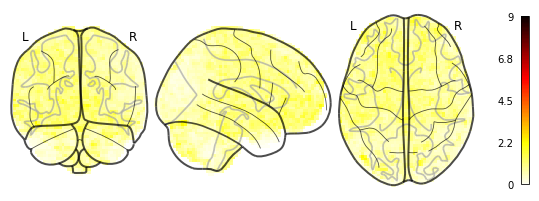

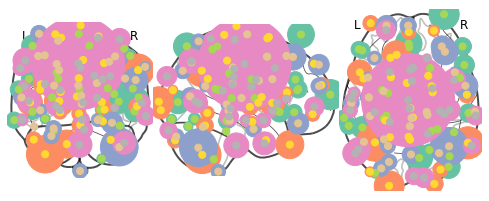

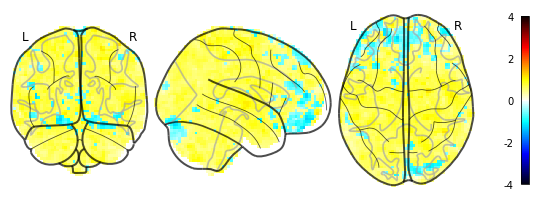

01/29/2020 15:41:17 Reconstruction Error (Frobenius Norm): 6.34322815e+01 out of 6.20751404e+02


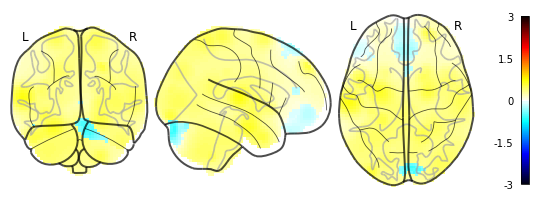

01/29/2020 15:41:19 Reconstruction Error (Frobenius Norm): 6.34322815e+01 out of 6.20751404e+02


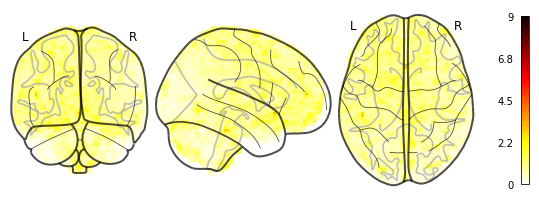

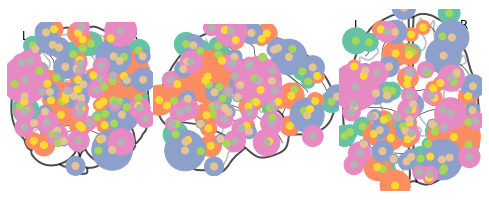

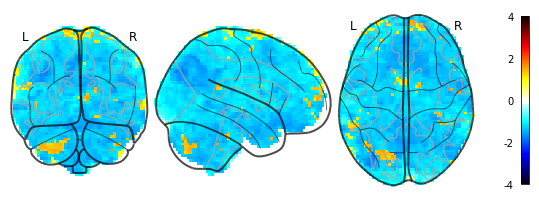

01/29/2020 15:41:23 Reconstruction Error (Frobenius Norm): 1.00730110e+02 out of 8.78814636e+02


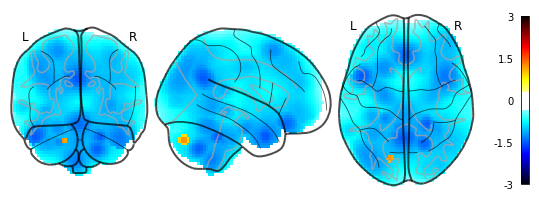

01/29/2020 15:41:24 Reconstruction Error (Frobenius Norm): 1.00730110e+02 out of 8.78814636e+02


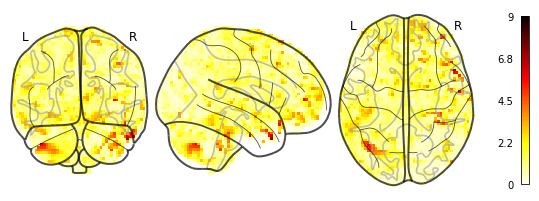

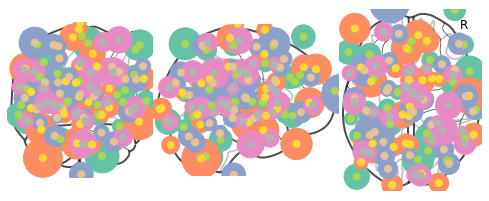

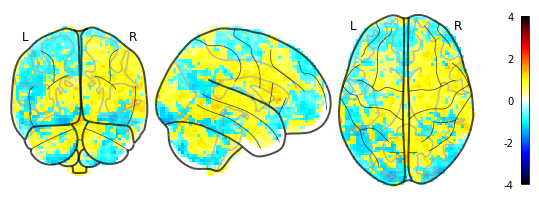

01/29/2020 15:41:29 Reconstruction Error (Frobenius Norm): 9.24085770e+01 out of 7.76537598e+02


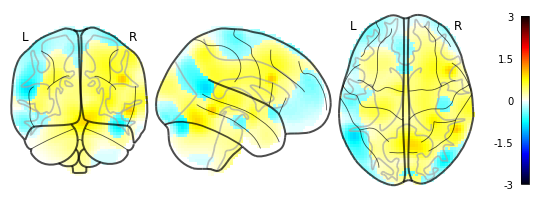

01/29/2020 15:41:30 Reconstruction Error (Frobenius Norm): 9.24085770e+01 out of 7.76537598e+02


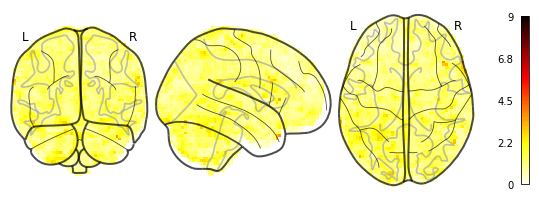

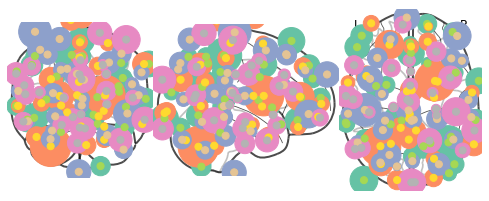

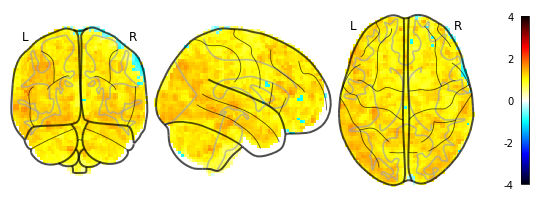

01/29/2020 15:41:34 Reconstruction Error (Frobenius Norm): 8.58467712e+01 out of 8.91481873e+02


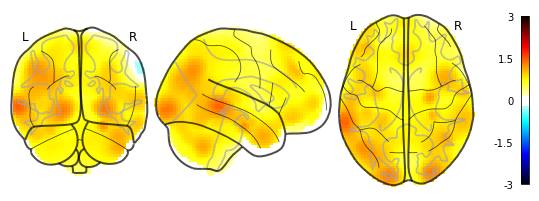

01/29/2020 15:41:36 Reconstruction Error (Frobenius Norm): 8.58467712e+01 out of 8.91481873e+02


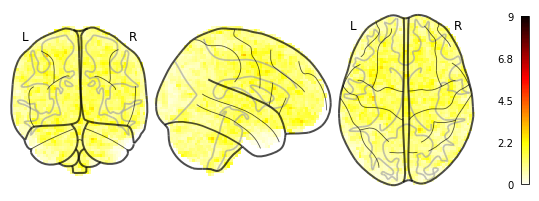

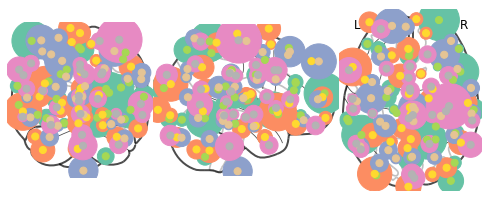

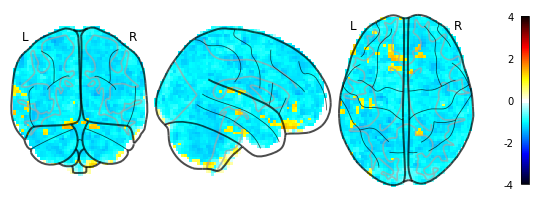

01/29/2020 15:41:40 Reconstruction Error (Frobenius Norm): 8.30629196e+01 out of 8.88662781e+02


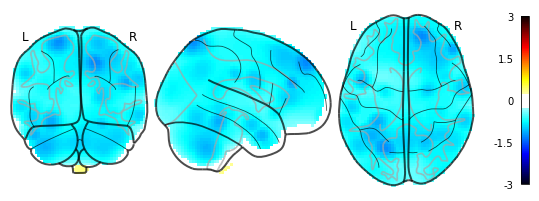

01/29/2020 15:41:42 Reconstruction Error (Frobenius Norm): 8.30629196e+01 out of 8.88662781e+02


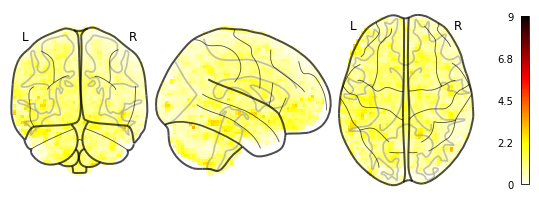

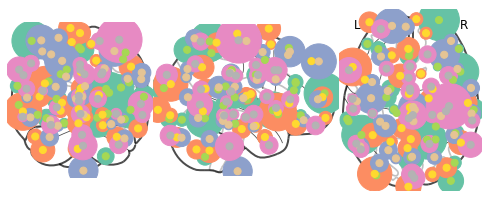

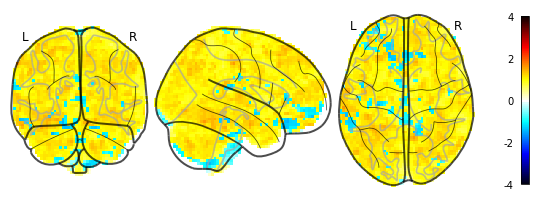

01/29/2020 15:41:46 Reconstruction Error (Frobenius Norm): 9.74194946e+01 out of 9.56630432e+02


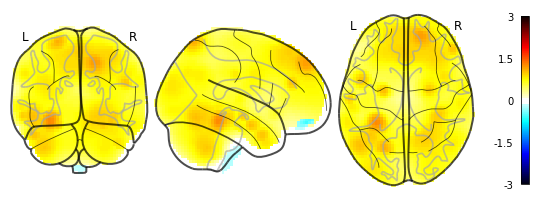

01/29/2020 15:41:47 Reconstruction Error (Frobenius Norm): 9.74194946e+01 out of 9.56630432e+02


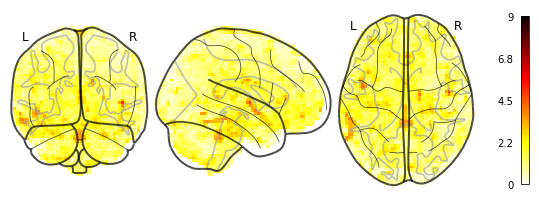

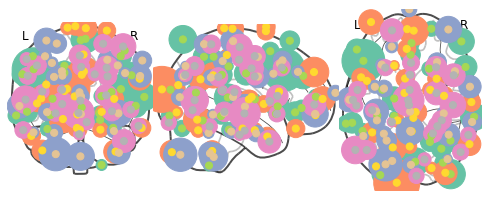

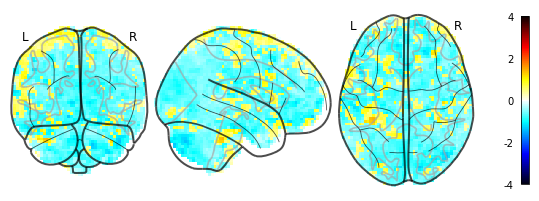

01/29/2020 15:41:52 Reconstruction Error (Frobenius Norm): 6.61631546e+01 out of 6.09349182e+02


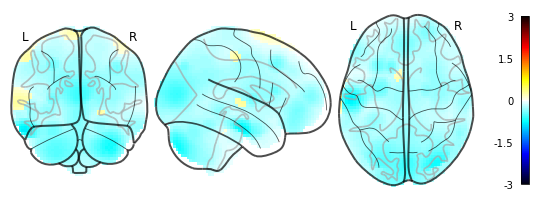

01/29/2020 15:41:53 Reconstruction Error (Frobenius Norm): 6.61631546e+01 out of 6.09349182e+02


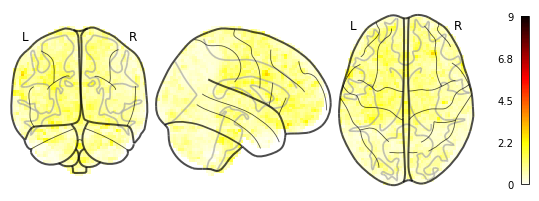

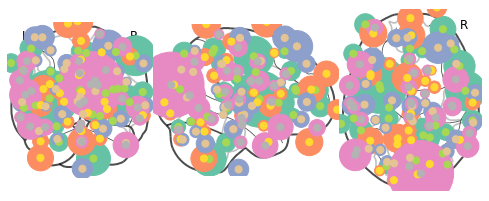

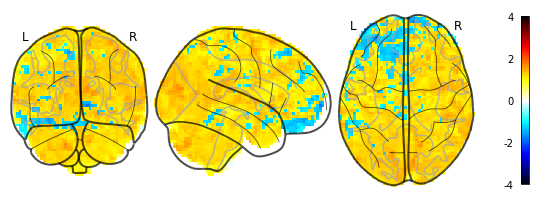

01/29/2020 15:41:57 Reconstruction Error (Frobenius Norm): 1.13151810e+02 out of 9.09648804e+02


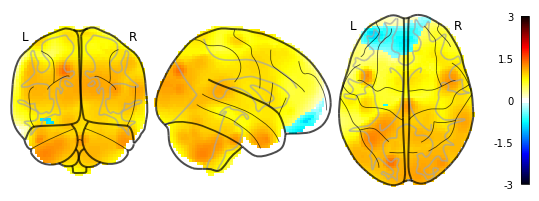

01/29/2020 15:41:59 Reconstruction Error (Frobenius Norm): 1.13151810e+02 out of 9.09648804e+02


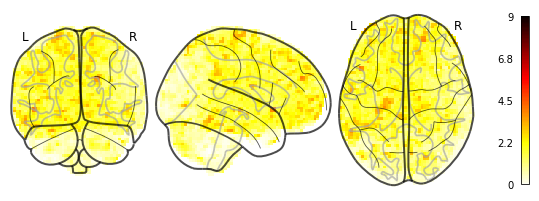

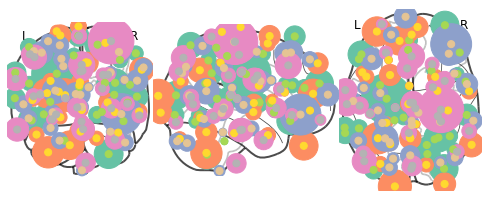

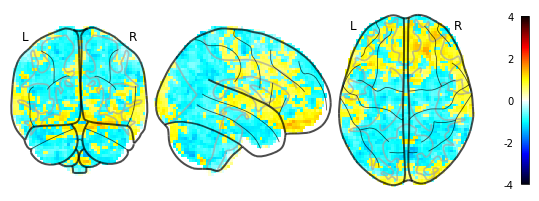

01/29/2020 15:42:03 Reconstruction Error (Frobenius Norm): 9.06409149e+01 out of 5.75361572e+02


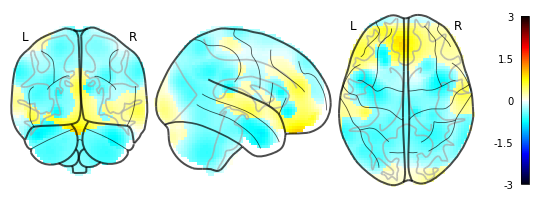

01/29/2020 15:42:05 Reconstruction Error (Frobenius Norm): 9.06409149e+01 out of 5.75361572e+02


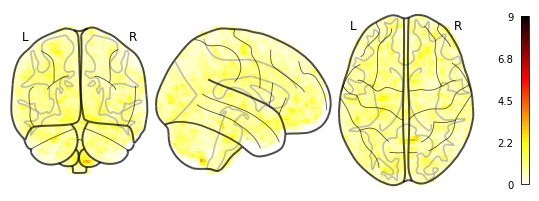

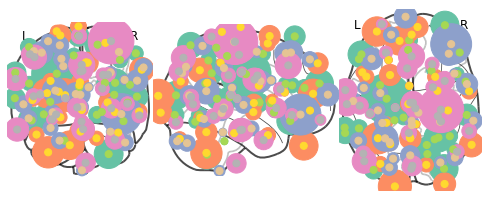

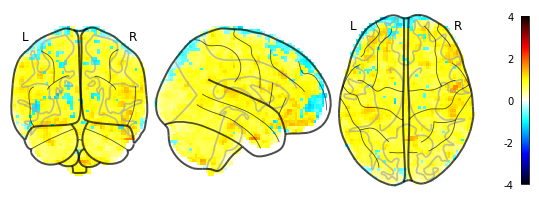

01/29/2020 15:42:09 Reconstruction Error (Frobenius Norm): 7.30797424e+01 out of 6.22596802e+02


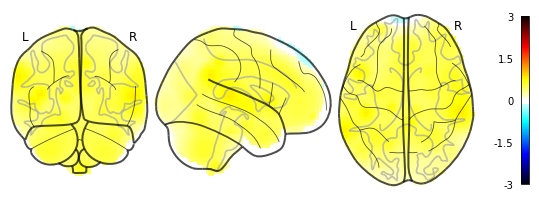

01/29/2020 15:42:10 Reconstruction Error (Frobenius Norm): 7.30797424e+01 out of 6.22596802e+02


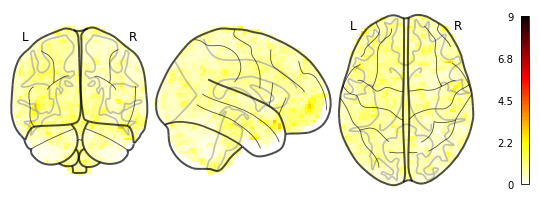

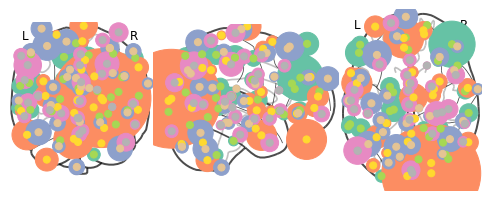

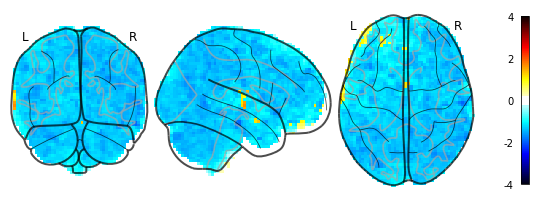

01/29/2020 15:42:15 Reconstruction Error (Frobenius Norm): 7.90895157e+01 out of 9.46378906e+02


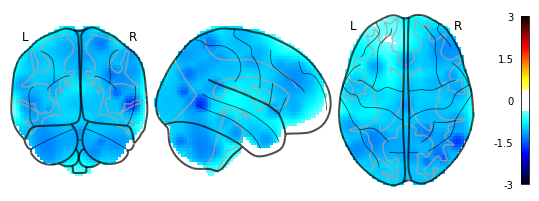

01/29/2020 15:42:16 Reconstruction Error (Frobenius Norm): 7.90895157e+01 out of 9.46378906e+02


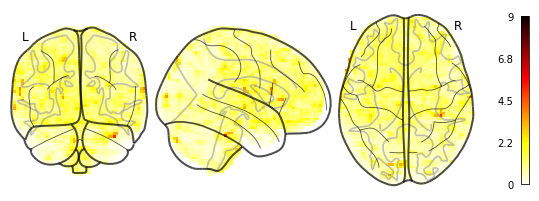

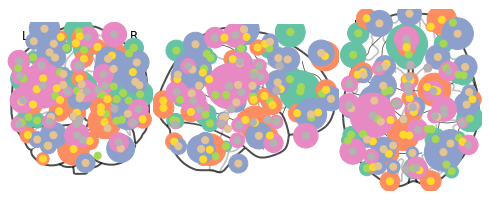

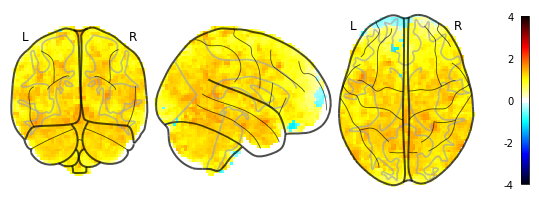

01/29/2020 15:42:20 Reconstruction Error (Frobenius Norm): 7.39526596e+01 out of 9.01897644e+02


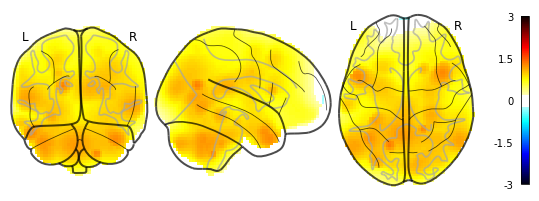

01/29/2020 15:42:22 Reconstruction Error (Frobenius Norm): 7.39526596e+01 out of 9.01897644e+02


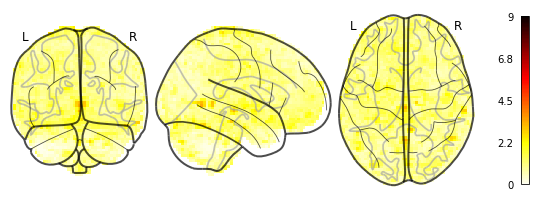

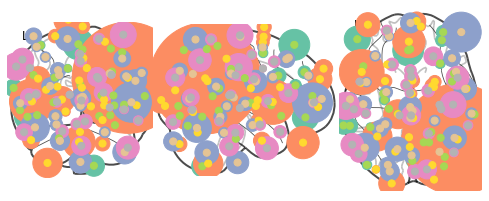

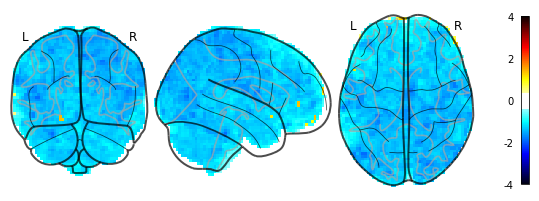

01/29/2020 15:42:26 Reconstruction Error (Frobenius Norm): 7.06666946e+01 out of 9.71673462e+02


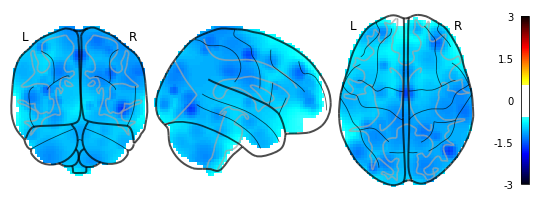

01/29/2020 15:42:28 Reconstruction Error (Frobenius Norm): 7.06666946e+01 out of 9.71673462e+02


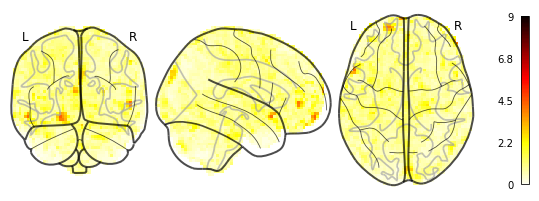

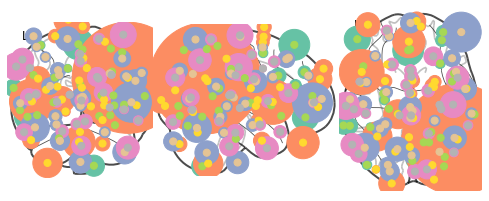

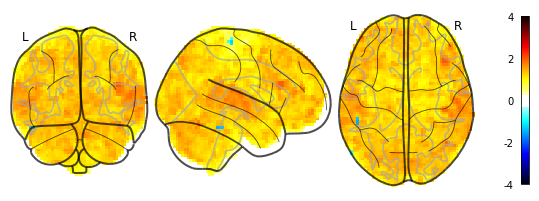

01/29/2020 15:42:32 Reconstruction Error (Frobenius Norm): 7.08580017e+01 out of 9.52562988e+02


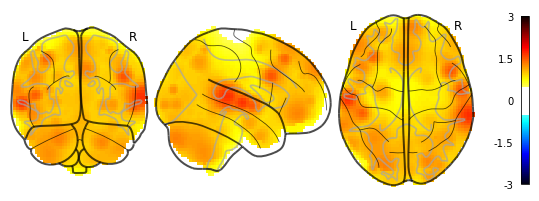

01/29/2020 15:42:34 Reconstruction Error (Frobenius Norm): 7.08580017e+01 out of 9.52562988e+02


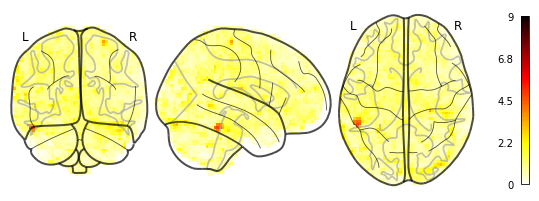

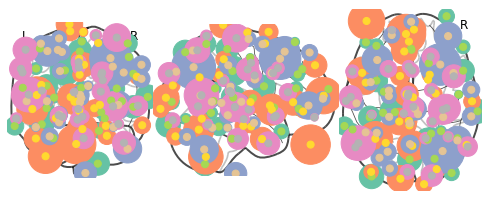

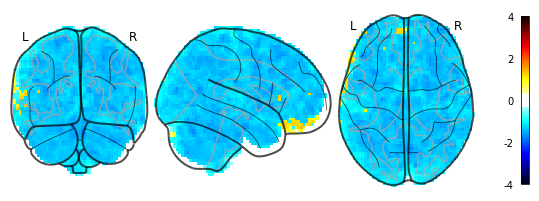

01/29/2020 15:42:38 Reconstruction Error (Frobenius Norm): 8.25198898e+01 out of 9.46299194e+02


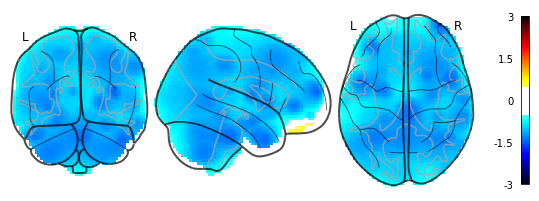

01/29/2020 15:42:39 Reconstruction Error (Frobenius Norm): 8.25198898e+01 out of 9.46299194e+02


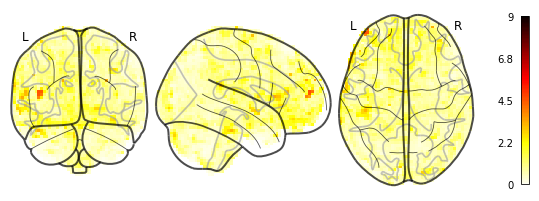

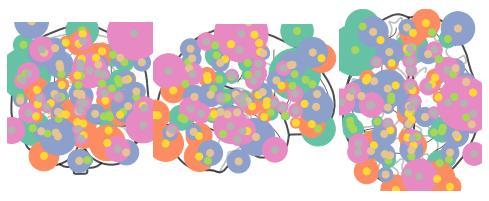

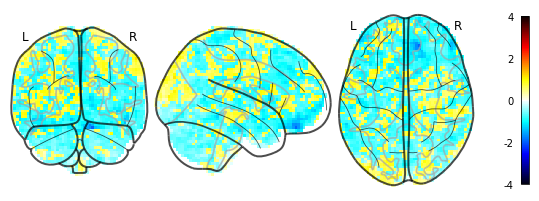

01/29/2020 15:42:43 Reconstruction Error (Frobenius Norm): 8.59700699e+01 out of 8.64135376e+02


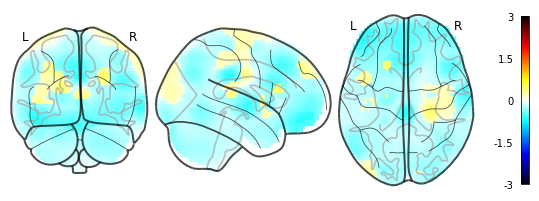

01/29/2020 15:42:45 Reconstruction Error (Frobenius Norm): 8.59700699e+01 out of 8.64135376e+02


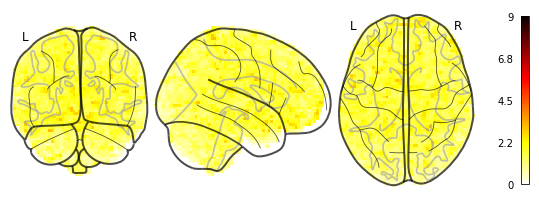

In [14]:
for index in validation_blocks[0:-1:3]:
    dtfa.plot_factor_centers(index)
    dtfa.plot_original_brain(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction(index, labeler=lambda b: None, t=None)
    dtfa.plot_reconstruction_diff(index, labeler=lambda b: None, t=None)

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:147: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


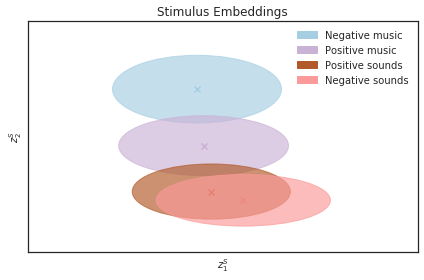

In [15]:
dtfa.scatter_task_embedding(labeler=task_labeler, colormap='Paired', figsize=None,
                            filename='lepping_2017_noresponse-task_embedding.pdf',
                            legend_ordering=[0, 2, 3, 1])

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:143: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()
/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:147: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


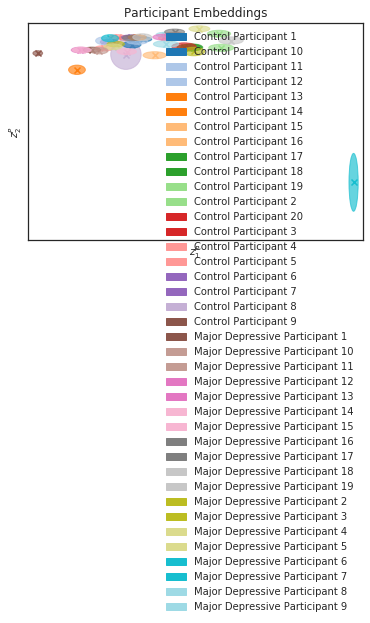

In [16]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None, colormap='tab20')

In [17]:
dtfa.average_reconstruction_error()

01/29/2020 15:43:27 Average reconstruction error (MSE): 6.66188666e-01
01/29/2020 15:43:27 Average data norm (Euclidean): 9.28131301e-01
01/29/2020 15:43:27 Percent average reconstruction error: 0.276637


(0.6661886663175056, 0.9281313013117286, 0.0027663744676323125)

In [18]:
dtfa.average_reconstruction_error(weighted=False)

01/29/2020 15:44:06 Average reconstruction error (MSE): 5.71713619e+02 +/- 8.78180124e+01
01/29/2020 15:44:06 Average data norm (Euclidean): 7.93378962e+02 +/- 1.40920768e+02
01/29/2020 15:44:06 Percent average reconstruction error: 73.438216 +/- 1.20671623e+01


(array([ 522.23779297,  526.56188965,  549.54705811,  534.86529541,
         636.44927979,  518.77093506,  532.71734619,  559.20172119,
         536.19348145,  529.99615479,  530.3727417 ,  533.52709961,
         517.92773438,  530.98120117,  548.51782227,  538.17138672,
         588.98907471,  577.32012939,  584.253479  ,  588.65258789,
         604.26043701,  617.28192139,  588.73266602,  645.3012085 ,
         600.68188477,  583.70684814,  598.02392578,  644.62402344,
         571.9786377 ,  640.78991699,  581.69525146,  579.28430176,
         543.51672363,  502.77667236,  534.56109619,  557.58197021,
         484.23147583,  521.2802124 ,  534.12701416,  513.41687012,
         571.2824707 ,  559.09899902,  530.04467773,  545.71783447,
         550.41314697,  515.31958008,  616.68566895,  513.29223633,
         528.80456543,  518.79815674,  493.76779175,  513.98864746,
         515.52893066,  501.03317261,  519.58483887,  502.58889771,
         584.44537354,  535.2545166 ,  533.20550

In [19]:
def condition_labeler(subject):
    subject_regex = re.compile("([A-Za-z]+)([0-9]{1,2})")
    m = subject_regex.search(subject)
    condition, sub_num = m.groups()
    if condition == 'mdd':
        return 'Major Depressive'
    elif condition == 'control':
        return 'Control'
    return condition

/home/eli/AnacondaProjects/HTFATorch/htfa_torch/utils.py:147: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


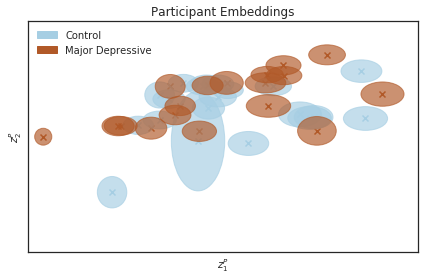

In [20]:
dtfa.scatter_subject_embedding(labeler=condition_labeler, colormap='Paired', figsize=None,
                               xlims=(-6, 4), ylims=(2.5, 5),
                               filename='lepping_2017_noresponse-subject_embedding.pdf')

In [21]:
dtfa.free_energy(batch_size=50, use_cuda=False, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=True))

[[407196576.0, -405680864.0, 1515686.5],
 [407223296.0, -405648288.0, 1517462.25]]

In [22]:
dtfa.free_energy(batch_size=50, use_cuda=False, blocks_batch_size=15, num_particles=1, sample_size=100,
                 blocks_filter=lepping_db.inference_filter(training=False))

[[77831216.0, -77556728.0, 274487.34375],
 [77857672.0, -77532056.0, 275185.59375]]